In [8]:
import torch
import json
import os
import numpy as np
try:
    from PIL import Image
except ImportError:
    import Image
import pytesseract
from pdf2image import convert_from_path
import tempfile
from pytesseract import Output
import cv2
import matplotlib.pyplot as plt
import nltk
from nltk.tokenize import word_tokenize
from nltk.tag import pos_tag
import spacy
from spacy import displacy
from collections import Counter
import en_core_web_trf
nlp = en_core_web_trf.load()


def preprocess(sent):
    sent = nltk.word_tokenize(sent)
    sent = nltk.pos_tag(sent)
    return sent


In [2]:
image_from_path = convert_from_path('./test_form.pdf')
for page in image_from_path:
    page.save('test_form.jpg', 'JPEG')
    break

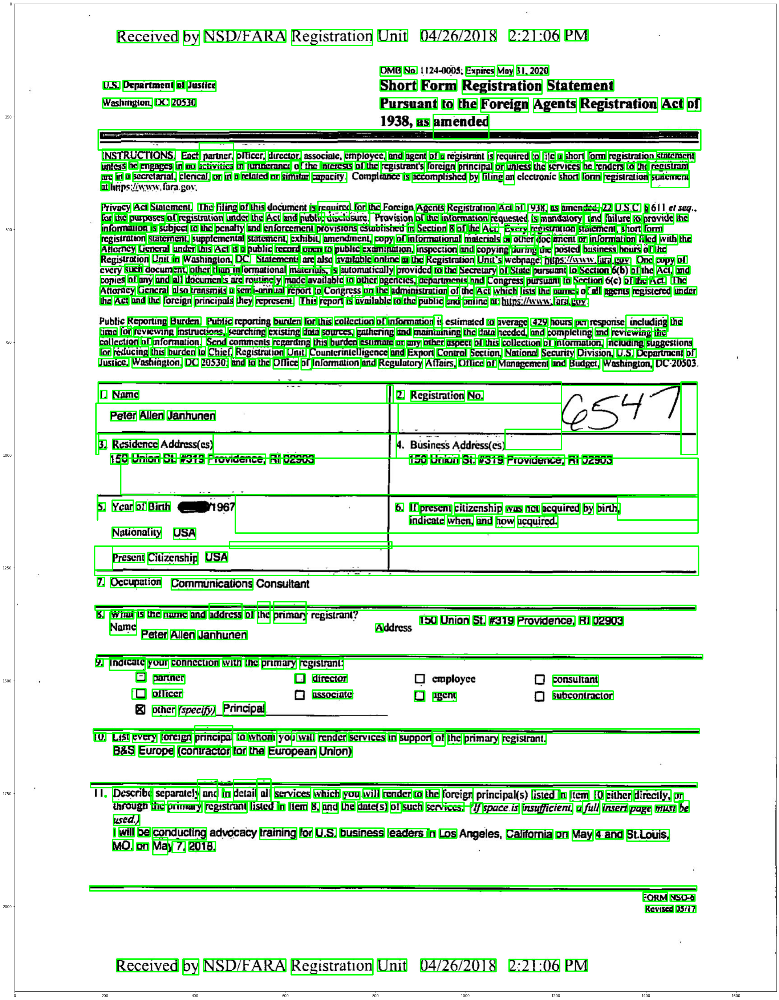

In [3]:
img = cv2.imread('test_form.jpg')
results = pytesseract.image_to_data(img, output_type=Output.DICT)
for i in range(0, len(results["text"])):
	# extract the bounding box coordinates of the text region from
	# the current result
    x = results["left"][i]
    y = results["top"][i]
    w = results["width"][i]
    h = results["height"][i]
	# extract the OCR text itself along with the confidence of the
	# text localization
    text = results["text"][i]
    conf = int(results["conf"][i])
    if conf > 50:
        text = "".join([c if ord(c) < 128 else "" for c in text]).strip()
        cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
        #cv2.putText(img, text, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX,1.2, (0, 0, 255), 3)


plt.figure(figsize=(50 , 50))
plt.imshow(img)
plt.show()


In [4]:
img = cv2.imread('test_form.jpg')
results = pytesseract.image_to_string(img , output_type=Output.STRING)
doc = nlp(results)
print([(X.text, X.label_) for X in doc.ents])



[('NSD/FARA Registration Unit', 'ORG'), ('04/26/2018 2:21:06 PM', 'DATE'), ('1124-0008', 'CARDINAL'), ('May 31,2020', 'DATE'), ('US', 'GPE'), ('Department of Justice', 'ORG'), ('Washington', 'GPE'), ('20530', 'CARDINAL'), ('the Foreign Agents Registration Act of', 'LAW'), ('the Foreign Agents Registration Act', 'LAW'), ('1938', 'DATE'), ('22 U.S.C. § 61 ler seg', 'LAW'), ('Act', 'LAW'), ('Section 8', 'LAW'), ('the posted business hours', 'TIME'), ('the\nRegistration Unit', 'ORG'), ('Washington', 'GPE'), ('DC', 'GPE'), ("the Registration Unit's", 'ORG'), ('One', 'CARDINAL'), ('State', 'ORG'), ('Congress', 'ORG'), ('Section 6(c)', 'LAW'), ('Congress', 'ORG'), ('.429 hours', 'TIME'), ('Nationa!', 'ORG'), ('U.S. Department of\n', 'ORG'), ('Washington', 'GPE'), ('DC', 'GPE'), ('20530', 'CARDINAL'), ('the Office of Information and Regulatory Affairs', 'ORG'), ('Office of Management and Budget', 'ORG'), ('Washington', 'GPE'), ('Providence', 'GPE'), ('RI', 'GPE'), ('2', 'CARDINAL'), ('Peter Al

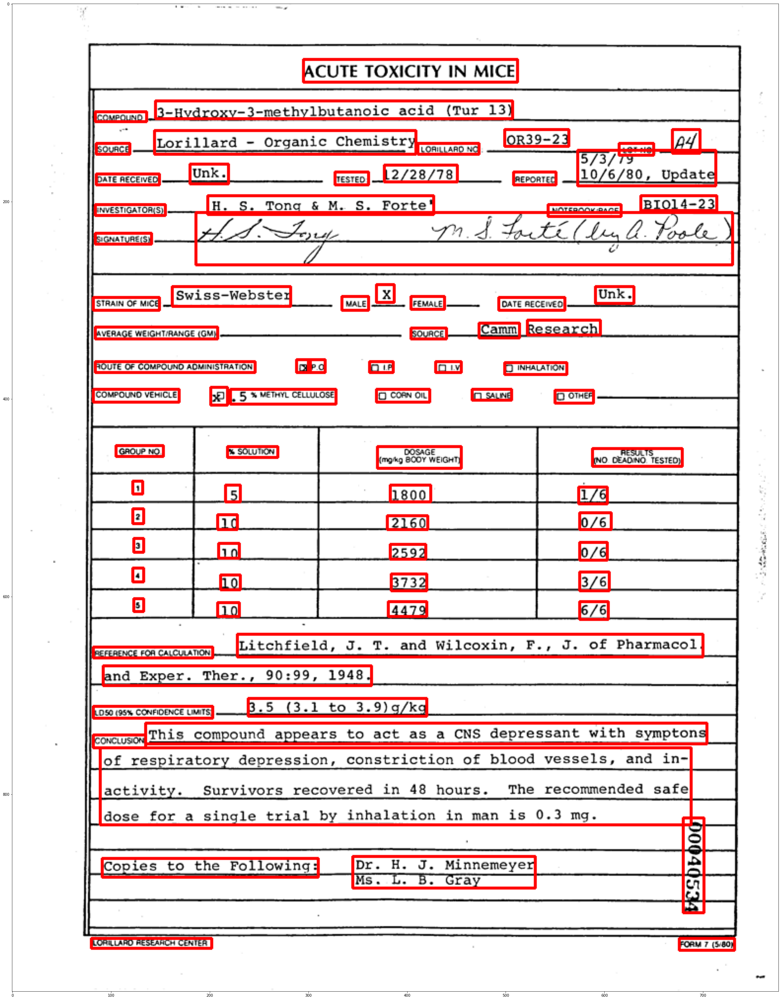

In [5]:
test_img = cv2.imread("./noisy_documents_dataset/training_data/images/00040534.png")
test_json_file = open("./noisy_documents_dataset/training_data/annotations/00040534.json")
test_file_dict = json.load(test_json_file)
for values in test_file_dict["form"]:
    box = values["box"]
    cv2.rectangle(test_img , (box[0] , box[1]) , (box[2] , box[3]) , (255 , 0 , 0) , 2)


    
plt.figure(figsize=(50 , 50))
plt.imshow(test_img)
plt.show()



In [6]:
def combine_two_boxes(box1: [int] , box2:[int]) -> [int]:
    x1_left = box1[0]
    x1_right = box1[2]
    y1_top = box1[1]
    y1_bottom = box1[3]
    x2_left = box2[0]
    x2_right = box2[2]
    y2_top = box2[1]
    y2_bottom = box2[3]
    x_new_left = min((x1_left , x2_left))
    x_new_right = max((x1_right , x2_right))
    y_new_bottom = max((y1_bottom , y2_bottom))
    y_new_top = min((y1_top , y2_top))
    return [x_new_left , y_new_top , x_new_right , y_new_bottom]


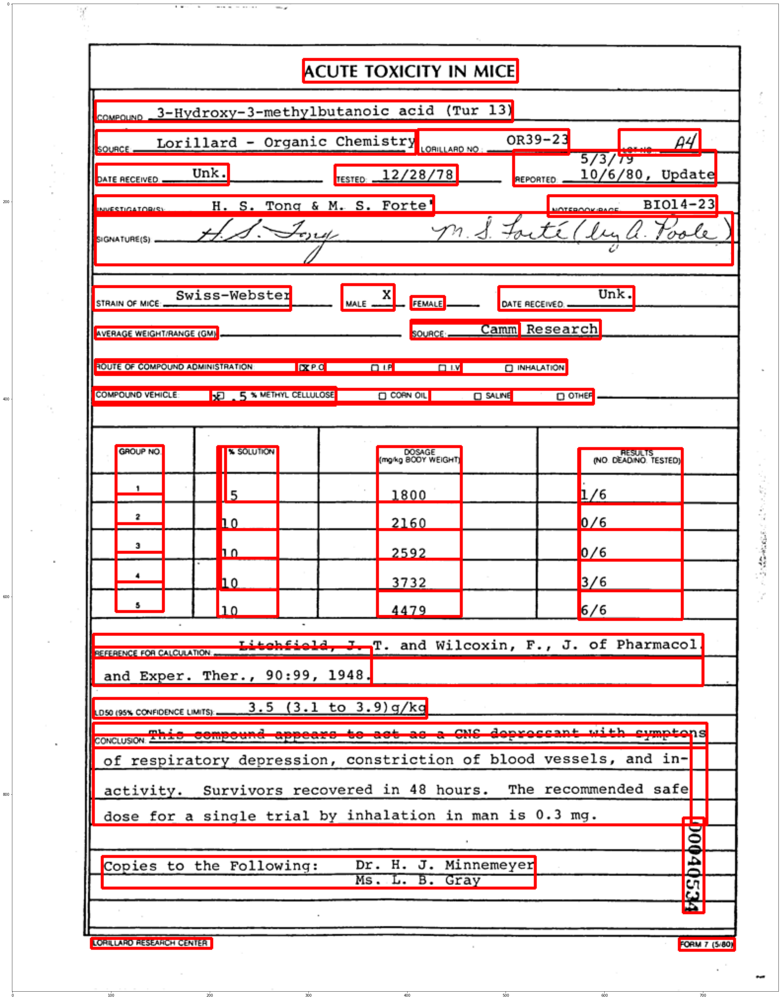

In [7]:
test_combined_img = cv2.imread("./noisy_documents_dataset/training_data/images/00040534.png")
test_combined_json = open("./noisy_documents_dataset/training_data/annotations/00040534.json")
test_combined_dict = json.load(test_combined_json)
already_combined_id = []
counter = 0
form_dict_list = test_combined_dict["form"]
while(len(already_combined_id) < len(form_dict_list)):
    first_bound_dict = form_dict_list[counter]
    curr_box = form_dict_list[counter]["box"]
    curr_box_link = form_dict_list[counter]['linking']
    for links in curr_box_link:
        for link in links:
                link_box = form_dict_list[link]["box"]
                curr_box = combine_two_boxes(link_box , curr_box)

    cv2.rectangle(test_combined_img, (curr_box[0] , curr_box[1]) , (curr_box[2] , curr_box[3]) , (255 , 0 , 0) , 2)
    already_combined_id.append(counter)
    counter += 1

plt.figure(figsize=(50 , 50))
plt.imshow(test_combined_img)
plt.show()

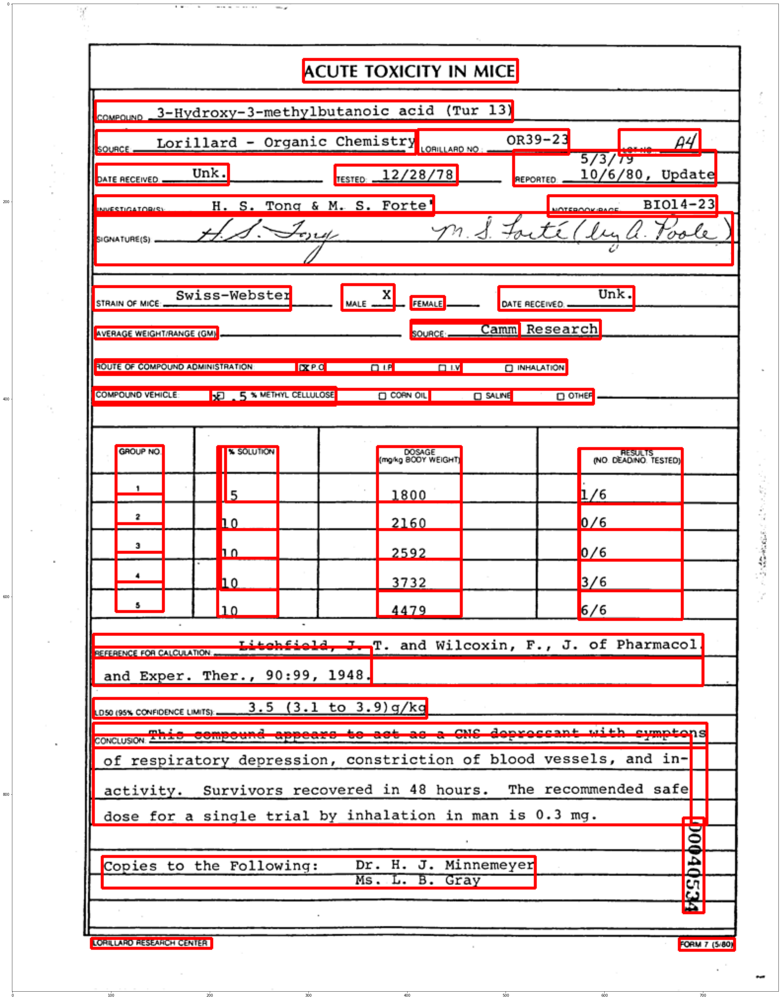

In [11]:
test_combined_img = cv2.imread("./noisy_documents_dataset/training_data/images/00040534.png")
test_combined_json = open("./noisy_documents_dataset/training_data/annotations/00040534.json")
test_combined_dict = json.load(test_combined_json)
already_combined_id = []
counter = 0
form_dict_list = test_combined_dict["form"]
while(len(already_combined_id) < len(form_dict_list)):
    if counter not in already_combined_id:
        first_bound_dict = form_dict_list[counter]
        curr_box = form_dict_list[counter]["box"]
        curr_box_link = form_dict_list[counter]['linking']
        for links in curr_box_link:
            for link in links:
                    link_box = form_dict_list[link]["box"]
                    curr_box = combine_two_boxes(link_box , curr_box)
                    already_combined_id.append(link)

        cv2.rectangle(test_combined_img, (curr_box[0] , curr_box[1]) , (curr_box[2] , curr_box[3]) , (255 , 0 , 0) , 2)
    already_combined_id.append(counter)
    counter += 1

plt.figure(figsize=(50 , 50))
plt.imshow(test_combined_img)
plt.show()

In [ ]:
path = "./noisy_documents_dataset/training_data/images/"
outPath = "./noisy_documents_dataset/training_data/masked_images/"
for images in os.listdir(path):
    


